## Setup

In [148]:
# Some default parameters

# Simulation settings
DEF_FRAMES = 100  # seconds
DEF_INTERVAL = 50

# Environment settings
DEF_MAPSIZE = 10  # in meters
DEF_AGENT_COUNT = 30
DEF_CLIP_AGENTS = False # Whether agents are constrained to the 10 x 10 map or can move outside of it.

# Agent settings
DEF_SPEED = 0.2  # meters per second
DEF_SPEED_STD = 0.0 # meters per second
DEF_PERSONAL_SPACE = 0.5  # radius in meters
DEF_PERSONAL_SPACE_WEIGHT = 0.15  # arbitrary value on a scale of 0 to 1

In [149]:
from IPython.display import HTML
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation


class ScatterViz:
    """Object to create simple animations usinga scatter plot."""

    def __init__(self, callback, point_count=DEF_AGENT_COUNT, points=None, colors=None, mapsize=DEF_MAPSIZE, clip_agents=DEF_CLIP_AGENTS, seed=42):
        self.mapsize = mapsize
        # the callback is used to update the points with a self-defined method.
        self.callback = callback
        self.clip_agents = clip_agents

        # Initializes points and colors.
        np.random.seed(seed)
        self.points = points if points else np.random.rand(
            point_count, 2) * self.mapsize
        self.colors = colors if colors else np.random.rand(len(self.points), 3)
        assert len(self.colors) == len(
            self.points), "Colors and points must have the same length"

        # Create the figure and scatter plot used for animation.
        self.fig, self.ax = plt.subplots(figsize=(5, 5))
        self.sc = self.ax.scatter(
            self.points[:, 0], self.points[:, 1], c=self.colors, s=50)

        # Set plot limits
        self.__resize_map()

    def update(self, _):
        # Updates the points and clamps them within bounds.
        self.points = self.callback(self.points)
        if self.clip_agents:
            self.points = np.clip(self.points, 0, self.mapsize)
        if not self.clip_agents:
            self.__resize_map()
        self.sc.set_offsets(self.points)
        return self.sc,

    def __resize_map(self):
        min_x = np.min([point[0] for point in self.points]) - 0.5
        min_y = np.min([point[1] for point in self.points]) - 0.5
        max_x = np.max([point[0] for point in self.points]) + 0.5
        max_y = np.max([point[1] for point in self.points]) + 0.5

        min_x = min(0, min_x)
        max_x = max(self.mapsize, max_x)
        min_y = min(0, min_y)
        max_y = max(self.mapsize, max_y)

        min_xy = min(min_x, min_y)
        max_xy = max(max_x, max_y)

        self.ax.set_xlim(min_xy, max_xy)
        self.ax.set_ylim(min_xy, max_xy)

    def start(self, frames=DEF_FRAMES, interval=DEF_INTERVAL):
        ani = FuncAnimation(self.fig, self.update,
                            frames=frames, interval=interval, blit=True)
        res = HTML(ani.to_jshtml())
        plt.close(self.fig)
        return res

## Policy A

Every agent X selects two other agents randomly: A and B (and memorizes them). During the
experiments agent X always tries to position itself between A and B. Every agent does the same.
Decision making of the agents must be strictly local.

In [205]:
# Solution without collision avoidance

def get_random_non_self_targets(seed, n=2, m=DEF_AGENT_COUNT):
    np.random.seed(seed)
    random_targets = np.array([
        np.random.choice([i for i in range(m)
                          if i != agent], size=n, replace=False)
        for agent in range(m)
    ])
    return random_targets

real_targets = dict()

def update_positions_between(points, speed=DEF_SPEED, speed_std=DEF_SPEED_STD):
    np.random.seed(42)
    new_points = [0.0] * len(points)
    for i, targets in enumerate(random_targets):
        x = points[i]
        a = points[targets[0]]
        b = points[targets[1]]
        # Selects the target to be between the two points.
        target = a + (b - a) / 2
        real_targets[i] = target
        delta = (target - x)
        norm_delta = delta / np.linalg.norm(delta)
        real_speed = np.random.normal(speed, speed_std)
        delta = norm_delta * real_speed
        new_points[i] = x + delta
    return new_points

In [206]:
# Solution with collision avoidance

from functools import partial


def avoid_colisions(points, inner, min_distance=DEF_PERSONAL_SPACE, distance_weight=DEF_PERSONAL_SPACE_WEIGHT, **kwargs):
    # Avoids collisions by giving points a personal space that they don't want to share.
    targets = inner(points, **kwargs)
    delta = [(0.0, 0.0)] * len(targets)
    for j, a in enumerate(targets):
        for i, b in enumerate(points):
            if i == j:
                continue
            d = b - a
            # If another point is in their space, they move the opposite direction.
            if np.linalg.norm(d) < min_distance:
                delta[j] = delta[j][0] - d[0], delta[j][1] - d[1]

    # Upscales the collision avoidance impact and updates the targets.
    delta = [(x[0] * distance_weight, x[1] * distance_weight) for x in delta]
    targets = [p + d for p, d in zip(targets, delta)]
    return targets


seed = 42
random_targets = get_random_non_self_targets(seed=seed)

upb_avoid = partial(avoid_colisions, inner=update_positions_between)

viz = ScatterViz(upb_avoid, seed=seed)
viz.start()

After running a couple of experiments, the behavior is pretty consistent. Agents cluster up rather quickly. The cluster itself still moves around, though, as agents push their way into the cluster towards their goal.

## Policy B

Initial setup is the same as in a). The difference is that X now tries to position itself so that B is
between A and X (“X hides behind B, so that A cannot attack/see...)

In [207]:
def update_positions_outside_between(points, speed=DEF_SPEED, speed_std=DEF_SPEED_STD):
    np.random.seed(42)
    new_points = [0.0] * len(points)
    for i, targets in enumerate(random_targets):
        x = points[i]
        a = points[targets[0]]
        b = points[targets[1]]
        # Sets the target to be outside the two points by extrapolation
        target = a - (b - a) / 2
        real_targets[i] = target
        delta = (target - x)
        # At some point, nodes will be on top of each other, so we skip the normalization.
        if not (delta[0] == 0 and delta[1] == 0):
            delta = delta / np.linalg.norm(delta)
        real_speed = np.random.normal(speed, speed_std)
        delta *= real_speed
        new_points[i] = x + delta
    return new_points


seed = 49
random_targets = get_random_non_self_targets(seed=seed)

upob_avoid = partial(avoid_colisions, inner=update_positions_outside_between)

viz = ScatterViz(upob_avoid, seed=seed)
viz.start(frames=int(DEF_FRAMES * 1.5))

The behavior is not quite consistent, however does show some patterns. Clearly, the agents do not cluster in the same way as with the other strategy. At the start, agents seem to move fairly chaotically, presumably because they try to avoid other agents while moving towards their goal. As a consequence, they meander a little before starting to follow a more-or-less consistent path. A nice example of this is the green node in `seed=44`, which initially gets stuck in a cluster of nodes, being released later after which it can consistently move upwards, slacking behind the other nodes that do that. Together with the pink and orange nodes, it creates a bit of a trail behind the cluster.

In general, the consistent path is outwards, though, the speed at which nodes move outwards can differ substantially. In some experiments, the nodes move approximately 15 meters away from the original center (e.g., `seed=42`), and in others 25 meters (e.g., `seed=44`), in the same timeframe. Note that, in this specific experiment, the maximum distance that can be traveled is 25 meters. This is not completely consistent, though, as for `seed=49` the agents barely move outside of the starting zone and seem to circle each other.

We observe different amount of "clustering", such that different agents divide themselves into groups they're interested in. An alternative description of "clustering" here is that the agents happen to run off in the same direction, which I think is more accurate. In some cases, these are quite clear (e.g., `seed=44`) in others not so much (e.g., `seed=42`). The size of these clusters differs substantially, likely dependent on the randomly chosen targets. For example, where `seed=46`, the "cluster" on the right only contains 3 nodes whereas the left one contains all others. In `seed=47` it's more balanced. In general, there seem to be only 1 or 2 clusters. I haven't observed anything else.

In the real-life experiment, we talked about trails a little bit, which I described a little bit in the first paragraph as well. A perfect example of this is `seed=48`, where we see one big trail moving across the simulation space.

## Special case 1: non-random targets

In the previous two examples, we assumed that the selected targets were truly random. This is not wholly realistic, as people rarely do something truly random (I don't, anyways). They might select people in close proximity, people they know, or people according to some personal agenda. I can't really model the last two without a specific context, for which I default to testing the first scenario. I therefore configured to pick 2 random agents from an agent's $k$ nearest neighbors. Because I expect the outcomes to converge to the first experiment's, I set $k=4$, a fairly low number.


In [136]:
def get_n_targets_in_k_nn(n, k, points, seed):
    np.random.seed(seed)
    targets = []
    for point in points:
        knn = np.argsort([np.linalg.norm(point - other) for other in points])
        knn = knn[1:k+1]
        my_targets = np.random.choice(knn, n, replace=False)
        targets.append(my_targets)
    return targets


seed = 49
upb_avoid = partial(avoid_colisions, inner=update_positions_between)
viz = ScatterViz(upb_avoid, seed=seed)

random_targets = get_n_targets_in_k_nn(2, 4, viz.points, seed)
viz.start()

In some cases the observed behavior is not different from the regular scenario (e.g., `seed=42`). However, we can see clear differences too. For example, where `seed=43`, instead of one big cluster forming, we see three smaller clusters. These clusters individually behave very similar to the general case. In some cases, agents seem to get stuck between clusters (e.g., `seed=44`). In other cases (e.g., `seed=45`) we see that clusters have awkward (non-spherical) shapes (e.g., a y-shape), which is what happens in the general case.

In [155]:
seed = 42
upob_avoid = partial(avoid_colisions, inner=update_positions_outside_between)
viz = ScatterViz(upob_avoid, seed=seed)

random_targets = get_n_targets_in_k_nn(2, 4, viz.points, seed)
viz.start(frames=int(DEF_FRAMES * 1.5))

When testing the same thing for the second policy, we see similar results. We see more clusters compared to the general case (e.g., `seed=42`), which has about 6 clusters (arguably). Further, we see much clearer trails, which form an almost perfect line (e.g., `seed=43`).

## Special case 2: variance in speeds

In [173]:
seed = 49
speed_std = 0.1  # meters per second.

upb_avoid = partial(
    avoid_colisions, inner=update_positions_between, speed_std=speed_std)
viz = ScatterViz(upb_avoid, seed=seed)

random_targets = get_random_non_self_targets(seed=seed)
viz.start()

Changes to the variance in speed does more or less what you would expect. We see that some agents reach the cluster much more quickly than others. In some cases, agents never even reach the cluster before the simulation time runs out (e.g., in `seed=43`). A nice example of a very quick agent is where `seed=45`. the node in the top left, rushes towards the to-be cluster and ends up right at the center of it when the simulation ends. In the scenario of extremely slow agents which are picked as targets by other agents, we can see that these get stuck between the main cluster and the slow agent (e.g., `seed=43`).

In [187]:
seed = 42
speed_std = 0.1  # meters per second.

upob_avoid = partial(
    avoid_colisions, inner=update_positions_outside_between, speed_std=speed_std)
viz = ScatterViz(upob_avoid, seed=seed)

random_targets = get_random_non_self_targets(seed=seed)
viz.start(frames=int(DEF_FRAMES * 1.5))

Adding variance in speed really highlights the "non-clusteriness" of the agents which was visible in the original experiment. Because some agents are very fast and others very slow, we see clear lines forming quite frequently (e.g., `seed=47`), most likely because the slow agents get stuck in the starting area. This is not to say that the nodes move in the same direction, though. As is visible in `seed=48`, half of the nodes still clearly move to the left, while the others clearly move to the right. We still see cases where the nodes do not rush off. For example, where `seed=49`, where agents move around each other never shooting off.

## Global comparison

To identify how well the algorithms generally achieve their goal, I want to evaluate them across many experiments. For this, I track how far each of the nodes is removed from their goal. I track this for the entire population, tracking the average, standard deviation, and median. Then across multiple simulations, I visualize the mean and standard deviation of these three variables.

### Default case

In [260]:
from wmutils.collections.safe_dict import SafeDict
import tqdm


def collect_metrics(points, inner, data_key, results, **kwargs):
    targets = inner(points, **kwargs)

    distances = []
    for i, agent in enumerate(points):
        real_target = real_targets[i]

        d = real_target - agent
        d = np.sqrt(d[0] ** 2 + d[1]**2)
        distances.append(d)

    data = (np.mean(distances),
            np.std(distances),
            np.median(distances))
    results[data_key].append(data)

    return targets


simulation_count = 50

between_default_results = SafeDict(default_value=list)
for i in tqdm.tqdm(range(simulation_count)):
    seed = 42 + i

    real_targets = dict()
    experimental_function = partial(collect_metrics, data_key="between-{0}".format(i),
                                    results=between_default_results,
                                    inner=partial(avoid_colisions,
                                                  inner=update_positions_between))
    random_targets = get_random_non_self_targets(seed=seed)
    viz = ScatterViz(experimental_function, seed=seed)
    viz.start()

100%|██████████| 50/50 [03:09<00:00,  3.80s/it]


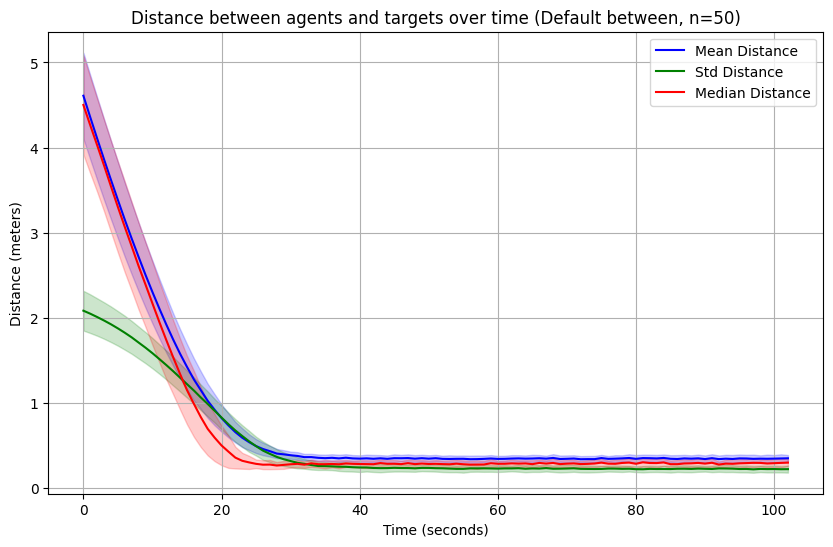

In [261]:
def plot_experimental_results(results, title):
    between_means = []
    between_stds = []
    between_medians = []

    for _, value in results.items():
        means = [x[0] for x in value]
        std = [x[1] for x in value]
        median = [x[2] for x in value]
        between_means.append(means)
        between_stds.append(std)
        between_medians.append(median)

    def get_mean_std(all_data):
        metric_means = []
        metric_stds = []
        for data in zip(*all_data):
            mean = np.mean(data)
            std = np.std(data)
            metric_means.append(mean)
            metric_stds.append(std)
        return metric_means, metric_stds

    mean_mean, mean_std = get_mean_std(between_means)
    std_mean, std_std = get_mean_std(between_stds)
    median_mean, median_std = get_mean_std(between_medians)

    lines = [("Mean", mean_mean, mean_std), ("Std", std_mean,
                                             std_std), ("Median", median_mean, median_std)]

    x = list(range(len(mean_mean)))

    # Plotting
    plt.figure(figsize=(10, 6))

    colors = ['blue', 'green', 'red']

    for (line_title, line_mean, line_std), line_color in zip(lines, colors):
        plt.plot(x, line_mean, label='{} Distance'.format(
            line_title), color=line_color)
        line_std_min = [x - y for x, y in zip(line_mean, line_std)]
        line_std_max = [x + y for x, y in zip(line_mean, line_std)]
        plt.fill_between(x, line_std_min, line_std_max,
                         color=line_color, alpha=0.2)

    # Add labels, legend, and grid
    plt.xlabel('Time (seconds)')
    plt.ylabel('Distance (meters)')
    plt.title('Distance between agents and targets over time ({}, n={})'
              .format(title, simulation_count))
    plt.legend()
    plt.grid(True)

    # Show the plot
    plt.show()


plot_experimental_results(between_default_results, 'Default between')

100%|██████████| 50/50 [03:21<00:00,  4.02s/it]


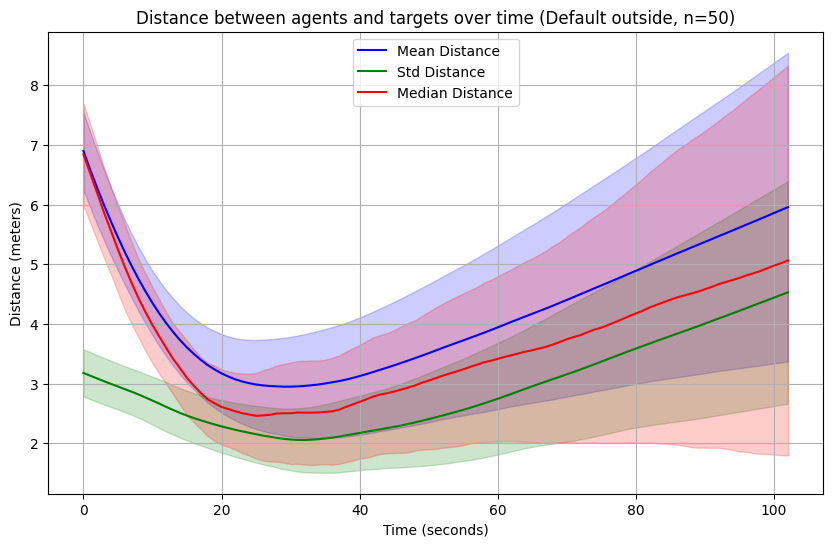

In [262]:
outside_default_results = SafeDict(default_value=list)
for i in tqdm.tqdm(range(simulation_count)):
    seed = 42 + i

    real_targets = dict()
    experimental_function = partial(collect_metrics, data_key="outside-{0}".format(i),
                                    results=outside_default_results,
                                    inner=partial(avoid_colisions,
                                                  inner=update_positions_outside_between))
    random_targets = get_random_non_self_targets(seed=seed)
    viz = ScatterViz(experimental_function, seed=seed)
    viz.start()
plot_experimental_results(outside_default_results, 'Default outside')

### Special case 1

100%|██████████| 50/50 [03:04<00:00,  3.69s/it]


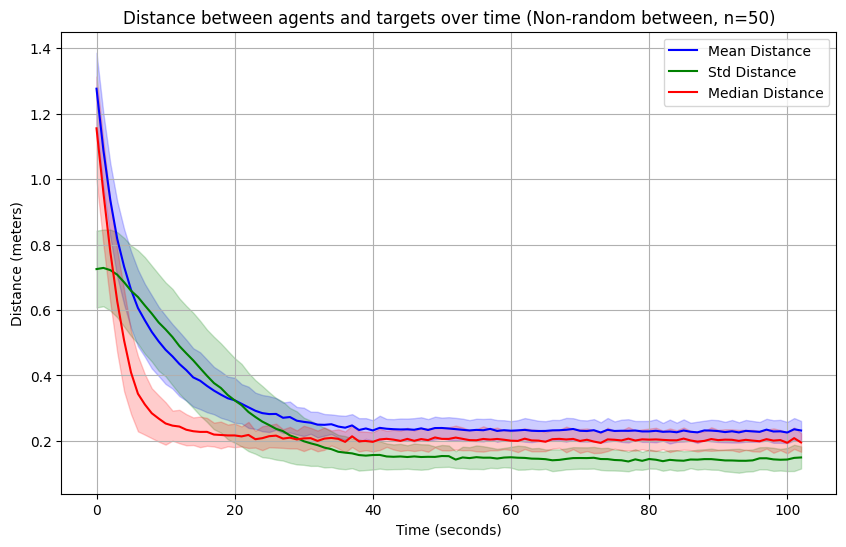

In [263]:
between_nonrandom_results = SafeDict(default_value=list)
for i in tqdm.tqdm(range(simulation_count)):
    seed = 42 + i

    real_targets = dict()
    experimental_function = partial(collect_metrics, data_key="between-nonrandom-{0}".format(i),
                                    results=between_nonrandom_results,
                                    inner=partial(avoid_colisions,
                                                  inner=update_positions_between))
    viz = ScatterViz(experimental_function, seed=seed)
    random_targets = get_n_targets_in_k_nn(2, 4, viz.points, seed)
    viz.start()

plot_experimental_results(between_nonrandom_results, 'Non-random between')

100%|██████████| 50/50 [03:13<00:00,  3.86s/it]


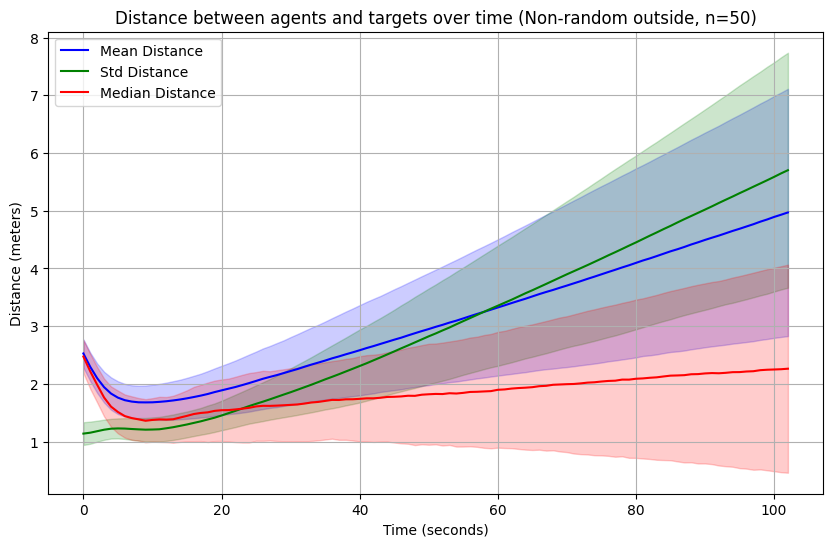

In [264]:
outside_nonrandom_results = SafeDict(default_value=list)
for i in tqdm.tqdm(range(simulation_count)):
    seed = 42 + i

    real_targets = dict()
    experimental_function = partial(collect_metrics, data_key="outside-nonrandom-{0}".format(i),
                                    results=outside_nonrandom_results,
                                    inner=partial(avoid_colisions,
                                                  inner=update_positions_outside_between))
    viz = ScatterViz(experimental_function, seed=seed)
    random_targets = get_n_targets_in_k_nn(2, 4, viz.points, seed)
    viz.start()

plot_experimental_results(outside_nonrandom_results, 'Non-random outside')

### Special case 2

100%|██████████| 50/50 [03:01<00:00,  3.64s/it]


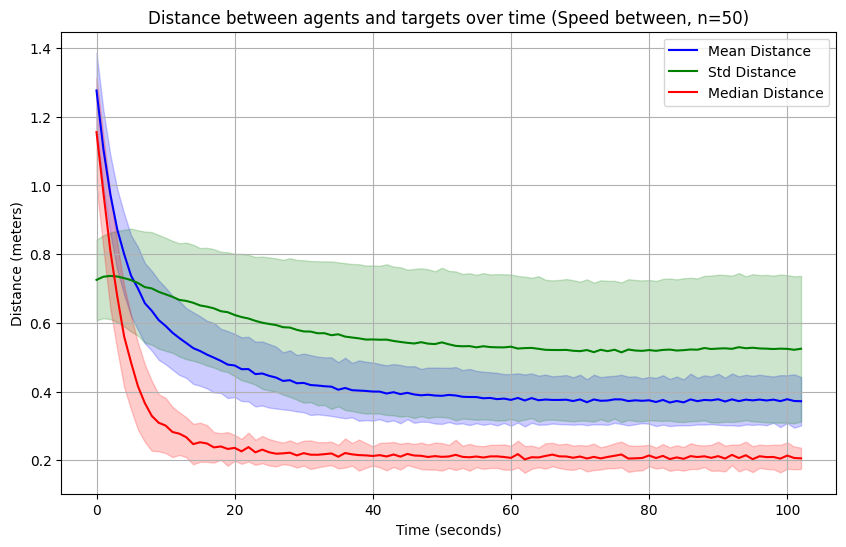

In [265]:
between_speed_results = SafeDict(default_value=list)
for i in tqdm.tqdm(range(simulation_count)):
    seed = 42 + i

    real_targets = dict()
    experimental_function = partial(collect_metrics, data_key="between-speed-{0}".format(i),
                                    results=between_speed_results,
                                    inner=partial(avoid_colisions,
                                                  inner=update_positions_between, speed_std=speed_std))
    viz = ScatterViz(experimental_function, seed=seed)
    random_targets = get_n_targets_in_k_nn(2, 4, viz.points, seed)
    viz.start()

plot_experimental_results(between_speed_results, 'Speed between')

100%|██████████| 50/50 [03:12<00:00,  3.86s/it]


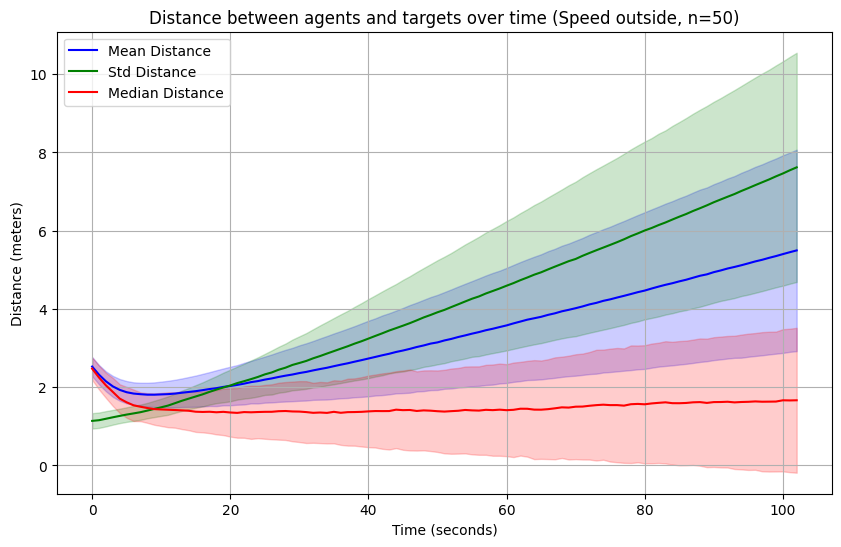

In [266]:
outside_speed_results = SafeDict(default_value=list)
for i in tqdm.tqdm(range(simulation_count)):
    seed = 42 + i

    real_targets = dict()
    experimental_function = partial(collect_metrics, data_key="outside-speed-{0}".format(i),
                                    results=outside_speed_results,
                                    inner=partial(avoid_colisions,
                                                  inner=update_positions_outside_between, speed_std=speed_std))
    viz = ScatterViz(experimental_function, seed=seed)
    random_targets = get_n_targets_in_k_nn(2, 4, viz.points, seed)
    viz.start()

plot_experimental_results(outside_speed_results, 'Speed outside')